## 检查环境内qutip,并import

In [1]:
! conda list

# packages in environment at C:\ProgramData\Anaconda3:
#
# Name                    Version                   Build  Channel
_anaconda_depends         2020.07                  py38_0  
_ipyw_jlab_nb_ext_conf    0.1.0                    py38_0  
alabaster                 0.7.12                     py_0  
anaconda                  custom                   py38_1  
anaconda-client           1.7.2                    py38_0  
anaconda-navigator        1.9.12                   py38_0  
anaconda-project          0.8.4                      py_0  
anyio                     2.0.2            py38haa244fe_3    conda-forge
argh                      0.26.2                   py38_0  
asn1crypto                1.3.0                    py38_0  
astroid                   2.4.2                    py38_0  
astropy                   4.0.1.post1      py38he774522_1  
atomicwrites              1.4.0                      py_0  
attrs                     19.3.0                     py_0  
autopep8               

In [2]:
from qutip import *
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

## 量子的秋千
经典的哈密顿量$H=\frac{p^{2}}{2m}+\frac{1}{2}m\omega^{2}x^{2}$
将经典质量做扰动，令到$m \rightarrow m+\delta m$,$\delta \ll 1$,$\delta = \epsilon (t)$,然后做一阶展开，得到
$$
H=\frac{p^{2}}{2(m+\delta \cdot m)}+\frac{1}{2}(m+\delta  \cdot m)\omega^{2}x^{2}
$$
$$
\approx \frac{p^{2}}{2m}+\frac{1}{2}m\omega^{2}x^{2}-\frac{p^{2}}{2m}\epsilon(t)+\frac{1}{2}m\omega^{2}x^{2}\epsilon(t)
$$ 
然后做正则量子化，并化简得到：
$$
H=H_{0}+H(t)=a^{\dagger}a+\frac{1}{2}+\frac{\epsilon(t)}{4}(a^{\dagger}a^{\dagger}+aa)
$$
取$\epsilon(t)=Acos(\omega _{0}t)$

In [3]:
N=10
a=destroy(N)
vac=basis(N,0)
t=np.linspace(0,1000,10000)

In [4]:
def result_u(A,w,plot_state=False,ind=0):
    H0=a.dag()*a+1/2.0
    H1=a.dag()*a.dag()+a*a
    global t
    g_t=H1_coeff(t,A,w)

    H = H0
    H_t = [H0,[H1,g_t]]

    psi0 = vac
    c_ops=[]
    if not plot_state:
        e_ops=[a.dag()*a]
        result = mesolve(H_t,psi0,t,c_ops=c_ops,e_ops=e_ops)
        return result.expect[ind]
    else:
        e_ops=[]
        result = mesolve(H_t,psi0,t,c_ops=c_ops,e_ops=e_ops)
        return result.states[ind]

def H1_coeff(t,A,w):
    return A*np.cos(w*t)

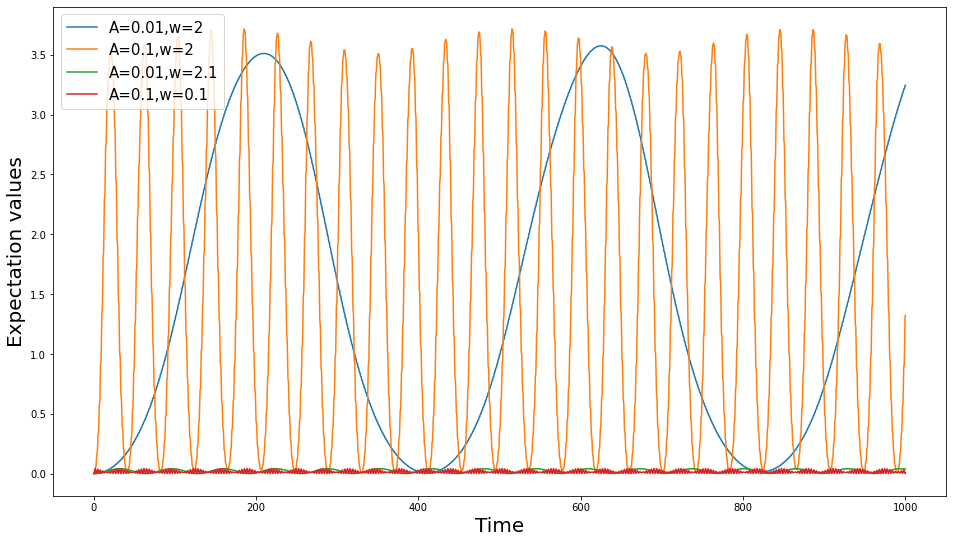

In [5]:
fig,ax = plt.subplots(figsize=(16,9))
ax.plot(t,result_u(0.01,2))
ax.plot(t,result_u(0.1,2))
ax.plot(t,result_u(0.01,2.1))
ax.plot(t,result_u(0.1,0.1))
ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Expectation values',fontsize=20)
ax.legend(('A=0.01,w=2','A=0.1,w=2','A=0.01,w=2.1','A=0.1,w=0.1'),fontsize=15)

In [6]:
def plot_wigner_2d_3d(psi):
    #fig, axes = plt.subplots(1, 2, subplot_kw={'projection': '3d'}, figsize=(12, 6))
    fig = plt.figure(figsize=(16, 6))
    
    ax = fig.add_subplot(1, 2, 1)
    plot_wigner(psi, fig=fig, ax=ax, alpha_max=6,colorbar=True);

    ax = fig.add_subplot(1, 2, 2, projection='3d')
    plot_wigner(psi, fig=fig, ax=ax, projection='3d', alpha_max=6,colorbar=True);
    #plt.close(fig)
    return fig

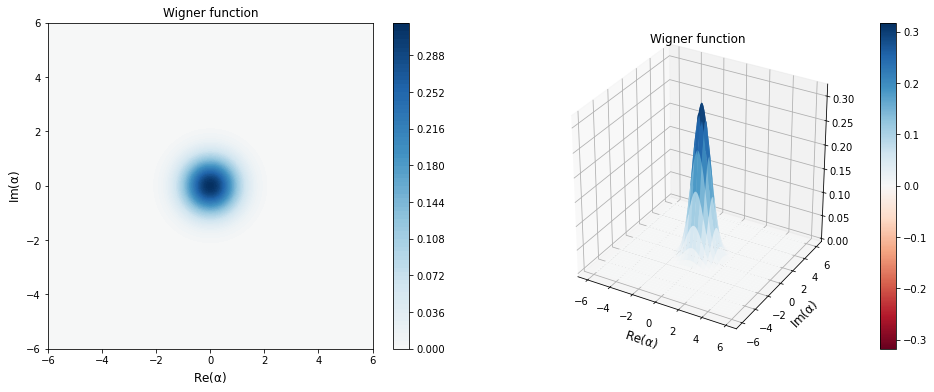

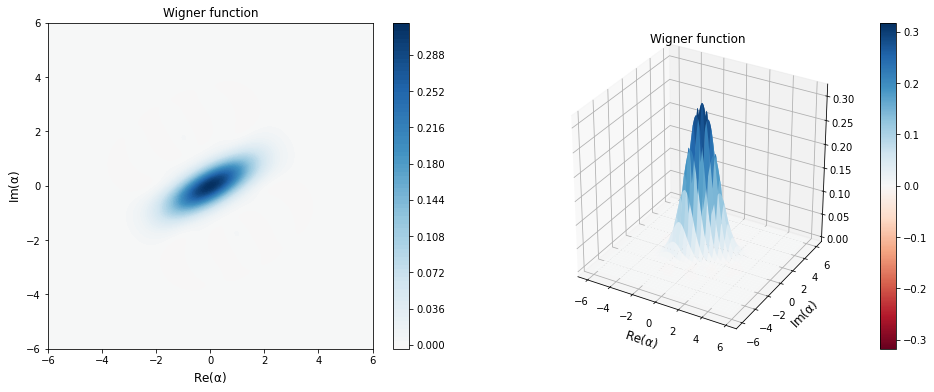

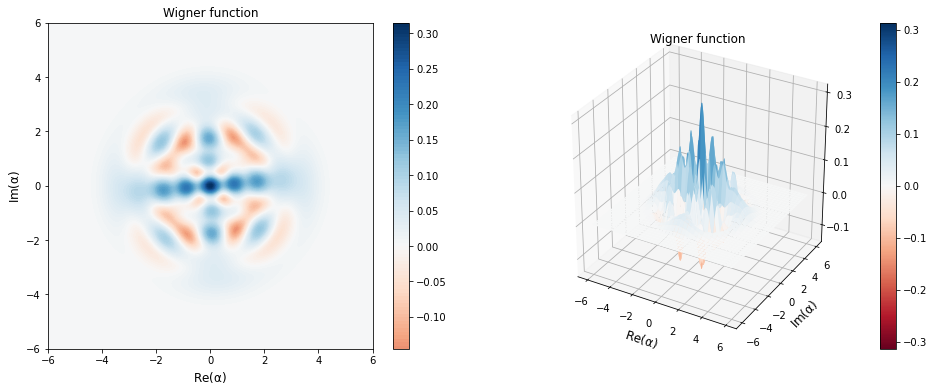

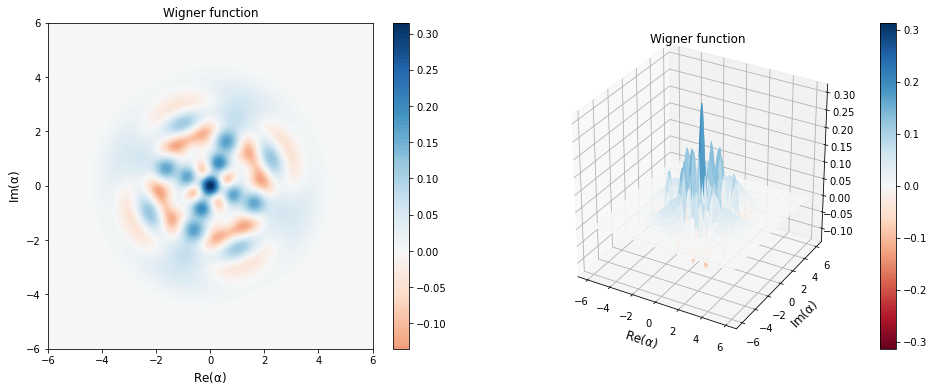

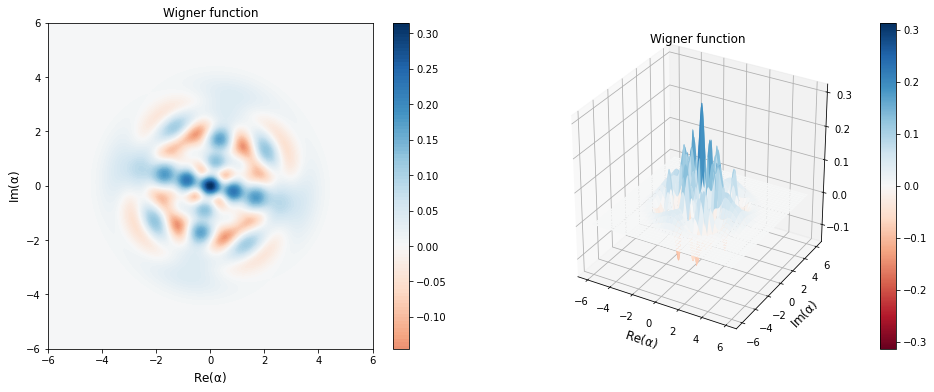

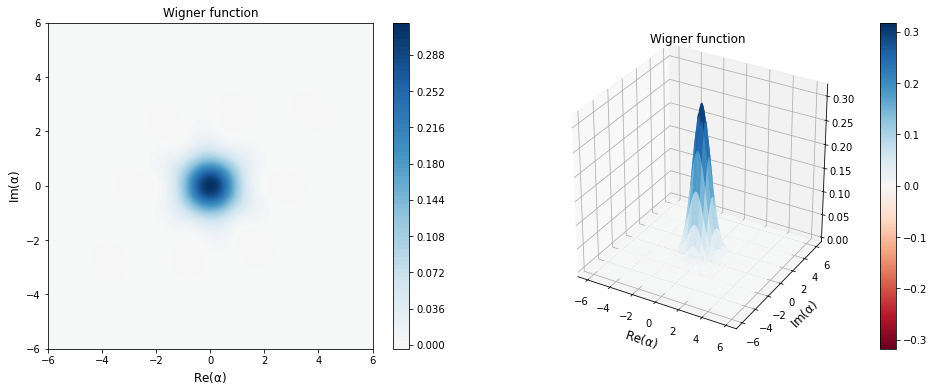

In [7]:
tlist=[0,50,180,200,230,410]
for ind in tlist:
    plot_wigner_2d_3d(result_u(0.1,2,plot_state=True,ind=ind))